content 디렉토리가 구글 클라우드의 리눅스의 개인 계정을 위한 home 디렉토리라고 생각하면 됨


<div><div class="highlight-default notranslate"><div class="highlight"><pre><span></span>content/
├─ scripts/ (Google Drive Mount)
│  └─ preprocessing/
├─ models/
│  ├─ community/
│  ├─ official/
│  ├─ orbit/
│  ├─ research/
│  └─ ...
└─ workspace/ (Google Drive Mount)
    └─ training_demo/
</pre></div>


<div><div class="highlight-default notranslate"><div class="highlight"><pre><span></span>training_demo/
├─ annotations/
├─ exported-models/
├─ images/
│  ├─ test/
│  └─ train/
├─ models/
├─ pre-trained-models/
└─ README.md
</pre></div>

* annotations: This folder will be used to store all *.csv files and the respective TensorFlow *.record files, which contain the list of annotations for our dataset images.

* exported-models: This folder will be used to store exported versions of our trained model(s).

* images: This folder contains a copy of all the images in our dataset, as well as the respective *.xml files produced for each one, once labelImg is used to annotate objects.

   * images/train: This folder contains a copy of all images, and the respective *.xml files, which will be used to train our model.

   * images/test: This folder contains a copy of all images, and the respective *.xml files, which will be used to test our model.

* models: This folder will contain a sub-folder for each of training job. Each subfolder will contain the training pipeline configuration file *.config, as well as all files generated during the training and evaluation of our model.

* pre-trained-models: This folder will contain the downloaded pre-trained models, which shall be used as a starting checkpoint for our training jobs.

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# This Colab requires TF 2.5.
!pip install -U "tensorflow>=2.5"

In [2]:
import os
import pathlib
import time

import matplotlib
import matplotlib.pyplot as plt

import re
from shutil import copyfile
import argparse
import math
import random

import io
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont
from six.moves.urllib.request import urlopen

import tensorflow as tf
# import tensorflow_hub as hub

%load_ext autoreload
%autoreload 2

# %matplotlib inline

tf.get_logger().setLevel('ERROR')

In [3]:
import warnings
warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings

In [4]:
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 81972, done.
remote: Counting objects: 100% (438/438), done.
remote: Compressing objects: 100% (209/209), done.
remote: Total 81972 (delta 275), reused 373 (delta 229), pack-reused 81534
Receiving objects: 100% (81972/81972), 596.35 MiB | 17.70 MiB/s, done.
Resolving deltas: 100% (58451/58451), done.


리눅스 계열
* 데비안 : 소프트웨어 설치 방식 : apt[S/W 설치 프로그램]

* 레드햇 : 소프트웨어 설치 방식 : yum[S/W 설치 프로그램]

In [ ]:
%%bash
sudo apt install -y protobuf-compiler
cd /content/models/research/
protoc object_detection/protos/*.proto --python_out=.
cd /content
git clone https://github.com/cocodataset/cocoapi.git
cd /content/cocoapi/PythonAPI
make
cp -r pycocotools /content/models/research/
cd /content/models/research/
cp object_detection/packages/tf2/setup.py .
python -m pip install .
cd /content

/content/gdrive/MyDrive/TF_OD_API

In [ ]:
# %%bash
# # mkdir "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1"
# mkdir "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace"
# mkdir "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/scripts"
# mkdir "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/scripts/preprocessing"
# mkdir "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo"
# mkdir "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/exported-models"
# mkdir "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images"
# mkdir "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/annotations"
# mkdir "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test"
# mkdir "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train"
# mkdir "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models"
# mkdir "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/pre-trained-models"


구글드라이브에 workspace를 구성하기 위해 단 한번만 아래의 압축파일 복사와 압축 해제 명령어를 수행한다.

In [ ]:
!pwd

/content


최초 처음 구글 드라이브의 특정 디렉토리에 Pascal VOC 데이터 세트를 다운받는다.

http://host.robots.ox.ac.uk/pascal/VOC/voc2012/VOCtrainval_11-May-2012.tar

http://host.robots.ox.ac.uk/pascal/VOC/voc2012/VOCtrainval_11-May-2012.tar

In [ ]:
!mkdir "/content/gdrive/MyDrive/datasets/"

In [ ]:
!wget http://host.robots.ox.ac.uk/pascal/VOC/voc2012/VOCtrainval_11-May-2012.tar -P "/content/gdrive/MyDrive/datasets/"

현재 Working 디렉토리에 복사한다.

In [ ]:
!cp "/content/gdrive/MyDrive/datasets/VOCtrainval_11-May-2012.tar" ./

In [ ]:
!tar -xvf ./VOCtrainval_11-May-2012.tar  # !tar -xvf /content/VOCtrainval_11-May-2012.tar 

In [ ]:
# !ls -al

In [ ]:
%cd ./VOCdevkit/VOC2012/JPEGImages/

In [ ]:
!pwd

JPEGImage 디렉토리안에 17,125개의 파일이 존재하면 정상적인 압축해제가 수행됨

In [ ]:
!ls -l | grep ^- | wc -l

In [ ]:
%cd /content

/content/VOCdevkit/VOC2012/JPEGImages

In [ ]:
imageDir = "/content/VOCdevkit/VOC2012/JPEGImages"

In [ ]:
images = [f for f in os.listdir(imageDir)
              if re.search(r'([a-zA-Z0-9\s_\\.\-\(\):])+(?i)(.jpg|.jpeg|.png)$', f)]        # 리눅스 정규식 표현 : 파일에 a-z,A-Z,0-9라 적혀있는 파일이면 모두 가져온다.

In [ ]:
ratio=0.1

In [ ]:
num_images = len(images)
num_test_images = math.ceil(ratio*num_images)
num_train_images = num_images - num_test_images

print("num_images=", num_images)
print("num_test_images=", num_test_images)
print("num_train_images=", num_train_images)

In [ ]:
train_dir = "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train"
test_dir = "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test"

In [ ]:
source = imageDir
print(source)

In [ ]:
copy_xml=True

In [ ]:
sourceXML="/content/VOCdevkit/VOC2012/Annotations"
print(sourceXML)

In [ ]:
filename = images[0]
print(filename)


In [ ]:
type(filename)

In [ ]:
len(filename)

In [ ]:
splistring = os.path.splitext(filename)
print(type(splistring))
print(splistring)

In [ ]:
os.path.splitext(filename)[0]

In [ ]:
xmls_filename = os.path.splitext(filename)[0]+'.xml'
print(xmls_filename)

In [ ]:
len(images)

In [ ]:
print("source=", source)
print("xmls_filename=", xmls_filename)
print(os.path.join(source, xmls_filename))  # source와 xmls_filename 사이에 '/'를 삽입

In [ ]:
for i in range(num_test_images):
  idx = random.randint(0, len(images)-1)
  filename = images[idx]
  copyfile(os.path.join(source, filename), os.path.join(test_dir, filename))
  if copy_xml:
    xml_filename = os.path.splitext(filename)[0]+'.xml'
    copyfile(os.path.join(sourceXML, xml_filename), os.path.join(test_dir,xml_filename))

  images.remove(images[idx])

# for filename in images:
#   copyfile(os.path.join(source, filename), os.path.join(train_dir, filename))
#   if copy_xml:
#     xml_filename = os.path.splitext(filename)[0]+'.xml'
#     print(copyfile(os.path.join(sourceXML, xml_filename), os.path.join(train_dir, xml_filename)))

In [ ]:
%%bash
cd "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test"
ls -l | grep ^- | wc -l

In [ ]:
%pwd

In [ ]:
for filename in images:
  copyfile(os.path.join(source, filename), os.path.join(train_dir, filename))
  if copy_xml:
    xml_filename = os.path.splitext(filename)[0]+'.xml'
    print(copyfile(os.path.join(sourceXML, xml_filename), os.path.join(train_dir, xml_filename)))

In [ ]:
%%bash
cd "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train"
ls -l | grep ^- | wc -l

15,412 * 2 = 30,824

In [ ]:
!pwd

/content


In [ ]:
!nvidia-smi

In [ ]:
!pip install pandas

In [ ]:
!pwd

In [ ]:
%cd /content/

In [ ]:
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py

In [ ]:
!cp "/content/models/research/object_detection/data/pascal_label_map.pbtxt" \
"/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/annotations"

In [ ]:
!mv "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/annotations/pascal_label_map.pbtxt" \
"/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/annotations/label_map.pbtxt"

In [ ]:
!pwd

In [ ]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import ops as utils_ops

collections : 파이썬 컨테이너 데이터형 \
[링크](https://docs.python.org/ko/3/library/collections.html)

make_tfrecord.py 코드 설명 실습



---





---



In [ ]:
from collections import namedtuple
import xml.etree.ElementTree as ET

In [ ]:
def xml_to_csv(path):
    """Iterates through all .xml files (generated by labelImg) in a given directory and combines
    them in a single Pandas dataframe.

    Parameters:
    ----------
    path : str
        The path containing the .xml files
    Returns
    -------
    Pandas DataFrame
        The produced dataframe
    """

    xml_list = []
    for xml_file in glob.glob(path + '/*.xml'):
        tree = ET.parse(xml_file)
        root = tree.getroot()
        filename = root.find('filename').text
        width = int(root.find('size').find('width').text)
        height = int(root.find('size').find('height').text)
        for member in root.findall('object'):
            bndbox = member.find('bndbox')
            xminf = float(bndbox.find('xmin').text)
            yminf = float(bndbox.find('ymin').text)
            xmaxf = float(bndbox.find('xmax').text)
            ymaxf = float(bndbox.find('ymax').text)
            value = (filename,
                     width,
                     height,
                     member.find('name').text,
                     int(xminf),
                     int(yminf),
                     int(xmaxf),
                     int(ymaxf),
                    #  int(bndbox.find('xmin').text),
                    #  int(bndbox.find('ymin').text),
                    #  int(bndbox.find('xmax').text),
                    #  int(bndbox.find('ymax').text),
                     )
            xml_list.append(value)
    column_name = ['filename', 'width', 'height',
                   'class', 'xmin', 'ymin', 'xmax', 'ymax']
    xml_df = pd.DataFrame(xml_list, columns=column_name)
    return xml_df

In [ ]:
output_path = "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/annotations/traintest.record"
image_dir = "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train"
xml_dir = "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train"

glob : 유닉스 스타일 경로명 패턴 확장 \
[링크](https://docs.python.org/ko/3/library/glob.html)

In [ ]:
import glob
import pandas as pd
import tensorflow.compat.v1 as tf

In [ ]:
writer = tf.python_io.TFRecordWriter(output_path)
path = os.path.join(image_dir)
examples = xml_to_csv(xml_dir)
print(examples)

              filename  width  height      class  xmin  ymin  xmax  ymax
0      2011_005510.jpg    375     500     person   144   255   244   425
1      2010_002388.jpg    333     500     bottle   132   203   231   500
2      2012_001540.jpg    477     317     person   205    86   297   203
3      2012_003492.jpg    500     375     person   356    44   397   155
4      2012_002816.jpg    500     333     person    40   219   200   333
...                ...    ...     ...        ...   ...   ...   ...   ...
32195  2009_003352.jpg    500     333      chair   174   104   272   240
32196  2009_003352.jpg    500     333      chair   346   105   450   241
32197  2009_003352.jpg    500     333      chair   452   101   500   239
32198  2009_002265.jpg    500     333      train    31    36   366   288
32199  2010_003915.jpg    500     425  aeroplane   215   134   382   282

[32200 rows x 8 columns]


In [ ]:
type(examples)

pandas.core.frame.DataFrame

In [ ]:
len(examples)

In [ ]:
Point = namedtuple('Point', ['x', 'y'])
Point.__doc__                   # docstring for the new class

'Point(x, y)'

In [ ]:
p = Point(11, y=22)             # instantiate with positional args or keywords
p[0] + p[1]                     # indexable like a plain tuple

33

In [ ]:
x, y = p                        # unpack like a regular tuple
x, y

(11, 22)

In [ ]:
p.x + p.y                       # fields also accessible by name

33

In [ ]:
d = p._asdict()                 # convert to a dictionary
d['x']

11

In [ ]:
Point(**d)                      # convert from a dictionary
# Point(x=11, y=22)

Point(x=11, y=22)

In [ ]:
p._replace(x=100)               # _replace() is like str.replace() but targets named fields


Point(x=100, y=22)

In [ ]:
def splitX(df, group):
    data = namedtuple('data', ['filename', 'object'])
    gb = df.groupby(group)
    return [data(filename, gb.get_group(x)) for filename, x in zip(gb.groups.keys(), gb.groups)]

In [ ]:
# data = namedtuple('data', ['filename', 'object'])
gb = examples.groupby('filename')
print(gb)


In [ ]:
print(gb.groups.keys())

dict_keys(['2007_000027.jpg', '2007_000032.jpg', '2007_000033.jpg', '2007_000039.jpg', '2007_000042.jpg', '2007_000061.jpg', '2007_000063.jpg', '2007_000068.jpg', '2007_000123.jpg', '2007_000129.jpg', '2007_000175.jpg', '2007_000187.jpg', '2007_000241.jpg', '2007_000243.jpg', '2007_000250.jpg', '2007_000323.jpg', '2007_000332.jpg', '2007_000346.jpg', '2007_000363.jpg', '2007_000364.jpg', '2007_000392.jpg', '2007_000423.jpg', '2007_000452.jpg', '2007_000464.jpg', '2007_000480.jpg', '2007_000491.jpg', '2007_000504.jpg', '2007_000528.jpg', '2007_000549.jpg', '2007_000559.jpg', '2007_000572.jpg', '2007_000584.jpg', '2007_000629.jpg', '2007_000645.jpg', '2007_000648.jpg', '2007_000661.jpg', '2007_000663.jpg', '2007_000664.jpg', '2007_000713.jpg', '2007_000720.jpg', '2007_000727.jpg', '2007_000733.jpg', '2007_000738.jpg', '2007_000762.jpg', '2007_000768.jpg', '2007_000783.jpg', '2007_000793.jpg', '2007_000804.jpg', '2007_000822.jpg', '2007_000830.jpg', '2007_000836.jpg', '2007_000847.jpg', '

In [ ]:
print(gb.groups)

{'2007_000027.jpg': [13315], '2007_000032.jpg': [12257, 12258, 12259, 12260], '2007_000033.jpg': [8542, 8543, 8544], '2007_000039.jpg': [5710], '2007_000042.jpg': [31586, 31587], '2007_000061.jpg': [23183, 23184], '2007_000063.jpg': [6465, 6466], '2007_000068.jpg': [22436], '2007_000123.jpg': [11302], '2007_000129.jpg': [9963, 9964, 9965, 9966, 9967, 9968], '2007_000175.jpg': [12131], '2007_000187.jpg': [28101], '2007_000241.jpg': [15917, 15918, 15919], '2007_000243.jpg': [25880], '2007_000250.jpg': [13494, 13495], '2007_000323.jpg': [41, 42], '2007_000332.jpg': [15346], '2007_000346.jpg': [29412, 29413, 29414, 29415], '2007_000363.jpg': [8458, 8459], '2007_000364.jpg': [6141, 6142, 6143], '2007_000392.jpg': [14218, 14219], '2007_000423.jpg': [16096, 16097], '2007_000452.jpg': [4275, 4276], '2007_000464.jpg': [9053, 9054], '2007_000480.jpg': [27504, 27505, 27506, 27507], '2007_000491.jpg': [3241], '2007_000504.jpg': [15891, 15892, 15893, 15894], '2007_000528.jpg': [30558], '2007_000549

In [ ]:
stopiter = 0
for filename, x in zip(gb.groups.keys(), gb.groups):
  print(filename)  
  print(gb.get_group(x))
  stopiter += 1
  print("**")
  if (stopiter > 5):
    break

2007_000027.jpg
              filename  width  height   class  xmin  ymin  xmax  ymax
13315  2007_000027.jpg    486     500  person   174   101   349   351
**
2007_000032.jpg
              filename  width  height      class  xmin  ymin  xmax  ymax
12257  2007_000032.jpg    500     281  aeroplane   104    78   375   183
12258  2007_000032.jpg    500     281  aeroplane   133    88   197   123
12259  2007_000032.jpg    500     281     person   195   180   213   229
12260  2007_000032.jpg    500     281     person    26   189    44   238
**
2007_000033.jpg
             filename  width  height      class  xmin  ymin  xmax  ymax
8542  2007_000033.jpg    500     366  aeroplane     9   107   499   263
8543  2007_000033.jpg    500     366  aeroplane   421   200   482   226
8544  2007_000033.jpg    500     366  aeroplane   325   188   411   223
**
2007_000039.jpg
             filename  width  height      class  xmin  ymin  xmax  ymax
5710  2007_000039.jpg    500     375  tvmonitor   156    89   

In [ ]:
showimage_path = "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train/2007_000032.jpg"

In [ ]:
def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.

    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.

    Args:
      path: the file path to the image

    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))

In [ ]:
image_np = load_image_into_numpy_array(showimage_path)

In [ ]:
plt.figure(figsize=(15,15))
plt.imshow(image_np)
plt.show()

In [ ]:
grouped = splitX(examples, 'filename')
# for group in grouped:
#   # tf_example = create_tf_example(group, path)
#   # writer.write(tf_example.SerializeToString())
# writer.close()

In [ ]:
print(grouped)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/scripts/preprocessing



---





---



In [ ]:
!ls -al "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/scripts/preprocessing/"

total 7
-rw------- 1 root root 6557 Mar  9 01:05 make_tfrecord.py


In [ ]:
!python "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/scripts/preprocessing/make_tfrecord.py" \
-x "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/train" \
-l "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/annotations/label_map.pbtxt" \
-o "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/annotations/train.record"

Successfully created the TFRecord file: /content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/annotations/train.record


In [ ]:
!python "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/scripts/preprocessing/make_tfrecord.py" \
-x "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test" \
-l "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/annotations/label_map.pbtxt" \
-o "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/annotations/test.record"

Successfully created the TFRecord file: /content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/annotations/test.record


In [ ]:
!pwd

/content


http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz

In [ ]:
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz

--2023-03-09 01:13:57--  http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 64.233.189.128, 2404:6800:4008:c07::80
Connecting to download.tensorflow.org (download.tensorflow.org)|64.233.189.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 211996178 (202M) [application/x-tar]
Saving to: ‘faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz’

faster_rcnn_resnet5 100%[===================>] 202.17M  52.2MB/s    in 3.9s    

2023-03-09 01:14:02 (52.2 MB/s) - ‘faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz’ saved [211996178/211996178]



In [ ]:
!tar xvfzp "/content/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz" \
-C "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/pre-trained-models"

faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/checkpoint/
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/checkpoint/ckpt-0.data-00000-of-00001
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/checkpoint/checkpoint
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/checkpoint/ckpt-0.index
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/pipeline.config
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/saved_model/
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/saved_model/saved_model.pb
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/saved_model/variables/
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/saved_model/variables/variables.data-00000-of-00001
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/saved_model/variables/variables.index


In [ ]:
!mkdir "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1"

In [ ]:
!cp "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/pre-trained-models/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/pipeline.config" \
"/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1"

In [ ]:
%load_ext tensorboard

In [ ]:
# %tensorboard --logdir="/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1"

# Fine-Tuning !!!

In [ ]:
!python /content/models/research/object_detection/model_main_tf2.py \
--model_dir="/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1" \
--pipeline_config_path="/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1/pipeline.config"

For Tensorboard After Training!!!

In [ ]:
!python /content/models/research/object_detection/model_main_tf2.py \
--model_dir="/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1" \
--pipeline_config_path="/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1/pipeline.config" \
--checkpoint_dir="/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1"

In [ ]:
!ps 

    PID TTY          TIME CMD
      1 ?        00:00:00 docker-init
      7 ?        00:00:13 node
     17 ?        00:00:05 oom_monitor.sh
     19 ?        00:00:00 run.sh
     20 ?        00:00:05 kernel_manager_
     38 ?        00:00:00 tail
     60 ?        00:00:04 python3 <defunct>
     61 ?        00:00:17 colab-fileshim.
     96 ?        00:00:14 jupyter-noteboo
     97 ?        00:00:09 dap_multiplexer
    428 ?        00:00:43 python3
    477 ?        00:00:18 python3
    636 ?        00:00:00 bash
    637 ?        00:00:00 drive
    638 ?        00:00:00 grep
    770 ?        00:00:42 drive
    865 ?        00:00:00 bash
    866 ?        00:00:01 directoryprefet
    867 ?        00:00:00 tail
    868 ?        00:00:00 python3
  33234 ?        00:00:59 node
  48780 ?        00:00:00 sleep
  48781 ?        00:00:00 ps


In [ ]:
# !kill 51088

In [ ]:
%tensorboard --logdir="/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1"

Output hidden; open in https://colab.research.google.com to view.

In [6]:
import time

In [7]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import ops as utils_ops

%matplotlib inline

In [ ]:
!mkdir "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/exported-models/saved_faster_rcnn_resnet50_v1"

In [ ]:
!python /content/models/research/object_detection/exporter_main_v2.py \
--input_type image_tensor \
--pipeline_config_path "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1/pipeline.config" \
--trained_checkpoint_dir "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/models/myft_faster_rcnn_resnet50_v1" \
--output_directory "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/exported-models/saved_faster_rcnn_resnet50_v1"

2023-03-08 04:44:12.457831: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2023-03-08 04:44:12.457935: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/lib64-nvidia
2023-03-08 04:44:12.457953: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Cannot dlopen some TensorRT libraries. If you would like to use Nvidia GPU with TensorRT, please make sure the missing libraries mentioned above are installed properly.
2023-03-08 04:44:15.826998: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:42] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environme

In [8]:
PATH_TO_MODEL_DIR = "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/exported-models/saved_faster_rcnn_resnet50_v1"
PATH_TO_SAVED_MODEL = PATH_TO_MODEL_DIR + "/saved_model"
print(PATH_TO_SAVED_MODEL)

/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/exported-models/saved_faster_rcnn_resnet50_v1/saved_model


In [9]:
print('Loading model...', end='')
start_time = time.time()

# Load saved model and build the detection function
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

Loading model...Done! Took 15.167705059051514 seconds


In [10]:
PATH_TO_LABELS = '/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/annotations/label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

In [ ]:
TEST_IMAGE_PATH = "/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test/"

In [ ]:
IMAGE_PATHS = [TEST_IMAGE_PATH + f for f in os.listdir('/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test')
              if re.search(r'([a-zA-Z0-9\s_\\.\-\(\):])+(?i)(.jpg|.jpeg)$', f)] 

In [ ]:
print(IMAGE_PATHS)

['/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test/2010_002778.jpg', '/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test/2010_001698.jpg', '/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test/2008_003831.jpg', '/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test/2012_003227.jpg', '/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test/2008_002681.jpg', '/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test/2007_007649.jpg', '/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test/2010_006435.jpg', '/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test/2007_007230.jpg', '/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test/

In [ ]:
print(IMAGE_PATHS[0])

/content/gdrive/MyDrive/TF_OD_API/faster_rcnn_resnet50_v1/workspace/training_demo/images/test/2010_002778.jpg


In [ ]:
# IMAGE_PATHS_SELS = IMAGE_PATHS[1000:1005]

In [ ]:
IMAGE_PATHS_SELS = IMAGE_PATHS

In [11]:
IMAGE_PATHS_SELS=["/content/ktx1.jpg"]

In [12]:
def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.

    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.

    Args:
      path: the file path to the image

    Returns:
      uint8 numpy array with shape (img_height, img_width, 3)
    """
    return np.array(Image.open(path))

Running inference for /content/ktx1.jpg... Done


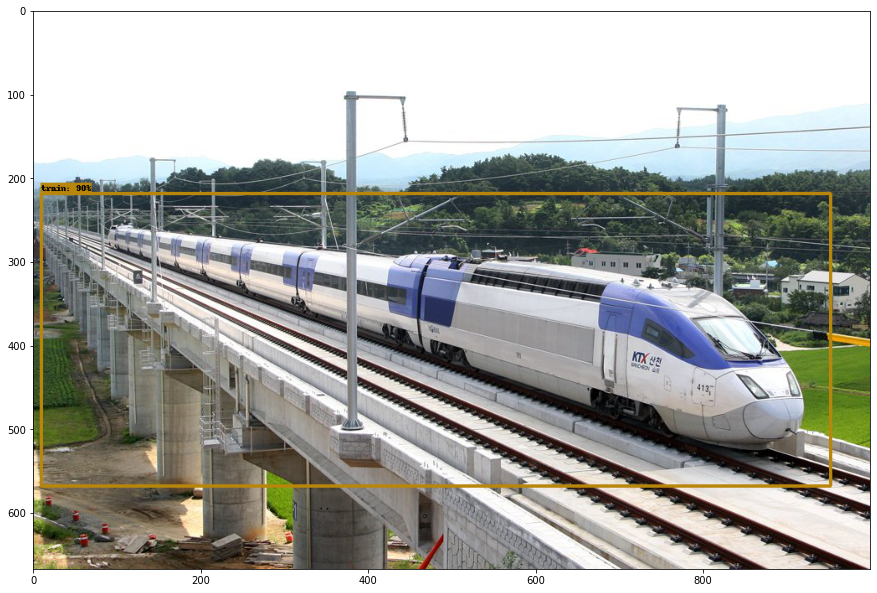

In [13]:
for image_path in IMAGE_PATHS_SELS:

    print('Running inference for {}... '.format(image_path), end='')

    # image_path = TEST_IMAGE_PATH + image_path
    image_np = load_image_into_numpy_array(image_path)
    
    # Things to try:
    # Flip horizontally
    # image_np = np.fliplr(image_np).copy()

    # Convert image to grayscale
    # image_np = np.tile(
    #     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

    # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor = tf.convert_to_tensor(image_np)
    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis, ...]

    # input_tensor = np.expand_dims(image_np, 0)
    detections = detect_fn(input_tensor)

    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                   for key, value in detections.items()}
    detections['num_detections'] = num_detections

    # detection_classes should be ints.
    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

    image_np_with_detections = image_np.copy()

    viz_utils.visualize_boxes_and_labels_on_image_array(
          image_np_with_detections,
          detections['detection_boxes'],
          detections['detection_classes'],
          detections['detection_scores'],
          category_index,
          use_normalized_coordinates=True,
          max_boxes_to_draw=200,
          min_score_thresh=.70,
          agnostic_mode=False)

    plt.figure(figsize=(15,15))
    plt.imshow(image_np_with_detections)
    print('Done')

plt.show()
